Решение задачи сегментации медицинских снимков (датасет ADDI project это фотографии двух типов поражений кожи: меланома и родинки. В данном случае я не  решал задачу классификации, а только сегментировал их.

In [ ]:
!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar

In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
cd /content/gdrive/MyDrive/Colab_Notebooks/

/content/gdrive/MyDrive/Colab_Notebooks


Загружаем изображения, делим по наименованию, ресайзим

In [3]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

In [4]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [5]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Чтобы убедиться, что все корректно, нарисуем несколько изображений:

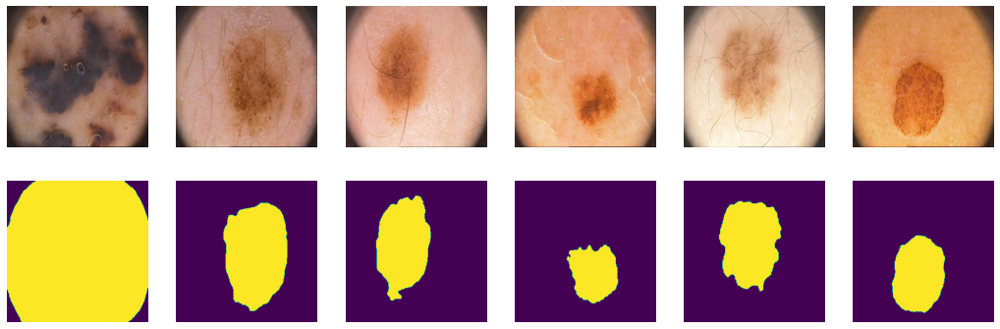

In [30]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show()

Разделим датасет на обучающаю, валидационную и тестовую выборки и создадим даталодеры:

In [6]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])
print(len(tr), len(val), len(ts))

100 50 50


In [32]:
from torch.utils.data import DataLoader
batch_size = 20
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])), 
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [8]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

Реализуем класс SegNet

In [10]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)  # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)  # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.pool3 =  nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) # 32 -> 16
        self.enc_conv4 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.pool4 =  nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) # 16 -> 8



         # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 8 -> 16
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.upsample1 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 16 -> 32
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.upsample2 = nn.MaxUnpool2d(kernel_size=2, stride=2)  # 32 -> 64
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.upsample3 = nn.MaxUnpool2d(kernel_size=2, stride=2)  # 64 -> 128
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.upsample4 = nn.MaxUnpool2d(kernel_size=2, stride=2)  # 128 -> 256
        self.dec_conv4 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 1, kernel_size=3, stride=1, padding=1),
        )

    def forward(self, x):
        # encoder
        e0, id0 = self.pool0(self.enc_conv0(x)) #3-64chnl
        e1, id1 = self.pool1(self.enc_conv1(e0)) #64-128chnl
        e2, id2 = self.pool2(self.enc_conv2(e1)) #128-256chnl
        e3, id3 = self.pool3(self.enc_conv3(e2)) #256-512chnl
        e4, id4 = self.pool4(self.enc_conv4(e3)) #512-512chnl

        # decoder
        d0 = self.upsample0(e4, indices=id4) #512-512chnl
        d1 = self.upsample1(self.dec_conv0(d0), indices=id3) #512-256chnl
        d2 = self.upsample2(self.dec_conv1(d1), indices=id2) #256-128chnl
        d3 = self.upsample3(self.dec_conv2(d2), indices=id1) #128-64chnl
        d4 = self.upsample4(self.dec_conv3(d3), indices=id0) #64-2chnl no activation
        d5 = self.dec_conv4(d4)
        return d5

В рамках курса где я нашел данное задание предлагалось использовать следующую метрику для оценки качества: 

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.

In [23]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):

    outputs = outputs.squeeze(1).byte()  
    labels = labels.squeeze(1).byte()
    outputs, labels = outputs.to(device), labels.to(device)
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2)) 
    union = (outputs | labels).float().sum((1, 2))         
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  
    
    return thresholded   

In [24]:
def score_model(model, metric, data):
    model.eval() 
    scores = 0
    sigm = nn.Sigmoid()
    for X_batch, Y_label in data:
        X_batch, Y_label = X_batch.to(device), Y_label.to(device)
        Y_pred = torch.round(sigm(model(X_batch)))
        scores += metric(Y_pred, Y_label.to(device)).mean().item()

    return scores/len(data)

В качестве функции лоса будем использовать бинарную крос энтрапию.

In [13]:
bce_loss = nn.BCELoss()

Определим цикл обучения

In [14]:
def train(model, opt, loss_fn, epochs, data_tr, data_val):
    X_val, Y_val = next(iter(data_val))
    sigm = nn.Sigmoid()

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            X_batch = X_batch.to(device) # перемещаем данные на гпу
            Y_batch = Y_batch.to(device) # перемещаем данные на гпу

            opt.zero_grad() # обнуляем градиент

            
            Y_pred = model(X_batch)
            loss =  loss_fn(sigm(Y_pred), Y_batch) # применяем сигмоиду к предсказаниям модели перед подсчетом лоса
            loss.backward() 
            opt.step()  # обновляем веса

            # подсчет лоса для отображения при обучении
            avg_loss += loss / len(data_tr)
        toc = time()
        print('loss: %f' % avg_loss)

        # отображение промежуточных результатов для эпохи
        model.eval()  # testing mode
        with torch.no_grad():
          Y_hat = torch.round(sigm(model(X_batch))).cpu() 
          X_show = X_batch.cpu()

        
        #clear_output(wait=True) #раскомментировать строчку для очистки отображения результатов после каждой эпохи
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.imshow(np.rollaxis(X_show[k].numpy(), 0, 3), cmap='gray') #изображения из батча
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, 6, k+7)
            plt.imshow(Y_hat[k, 0], cmap='gray') #предсказания модели по этим изображениям
            plt.title('Output')
            plt.axis('off')
        plt.suptitle('%d / %d - loss: %f' % (epoch+1, epochs, avg_loss))
        plt.show()

In [17]:
model = SegNet().to(device)

* Epoch 1/10
loss: 0.220364


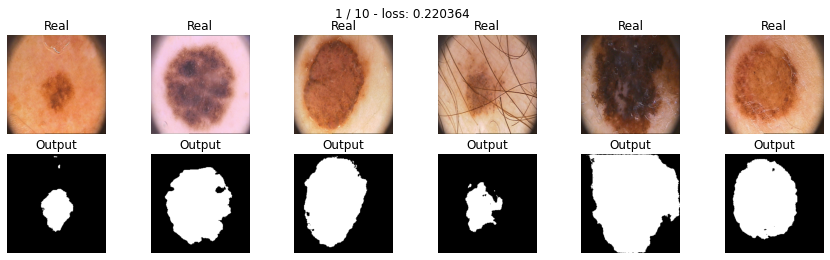

* Epoch 2/10
loss: 0.222094


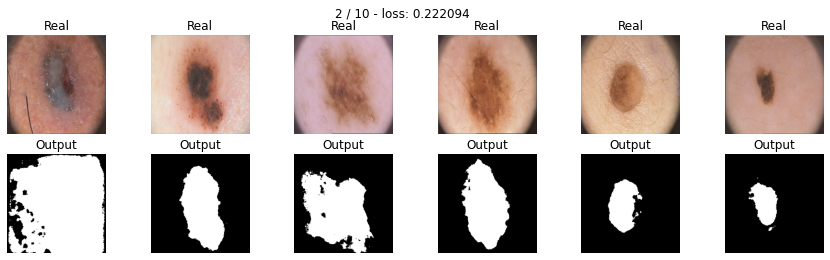

* Epoch 3/10
loss: 0.194409


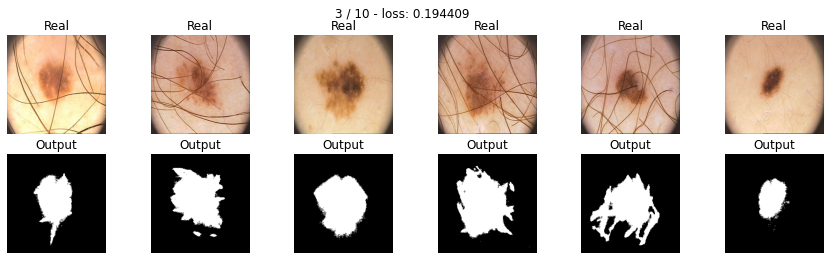

* Epoch 4/10
loss: 0.168981


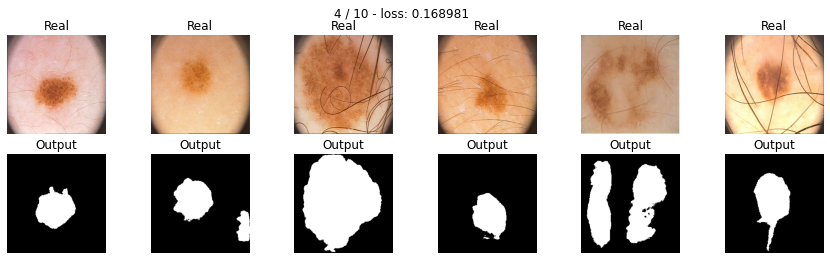

* Epoch 5/10
loss: 0.172929


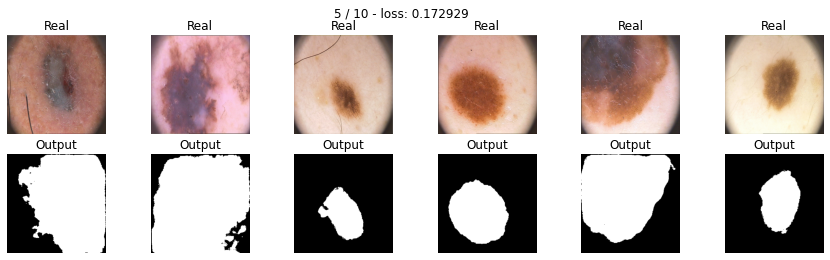

* Epoch 6/10
loss: 0.154217


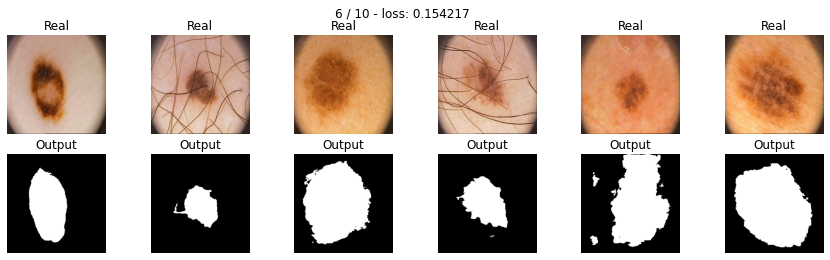

* Epoch 7/10
loss: 0.155608


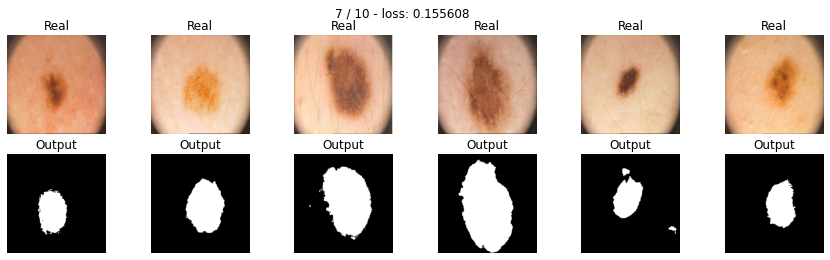

* Epoch 8/10
loss: 0.141779


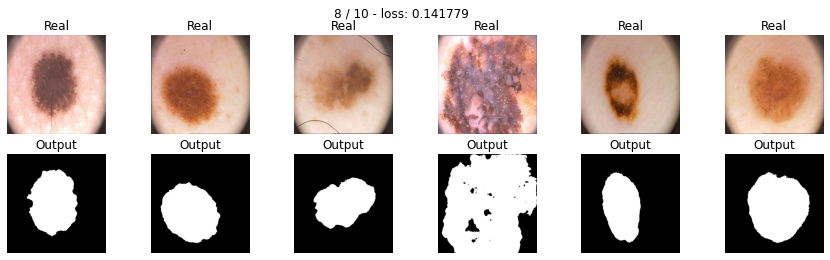

* Epoch 9/10
loss: 0.209401


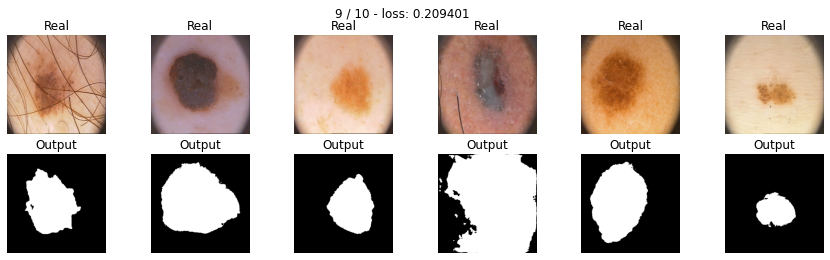

* Epoch 10/10
loss: 0.161944


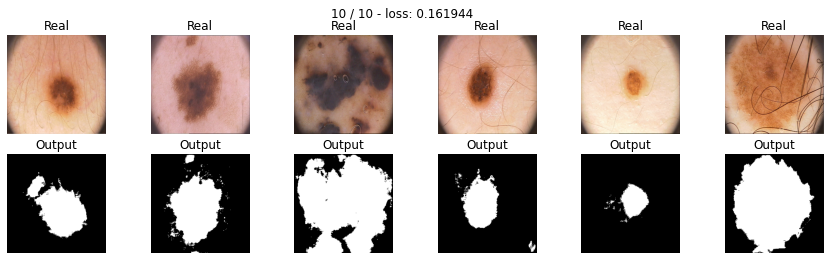

In [20]:
max_epochs = 10
optim = torch.optim.Adam(model.parameters())
train(model, optim, bce_loss, max_epochs, data_tr, data_val)

Произведем оценку модели:

In [19]:
score_model(model, iou_pytorch, data_val)

0.40000001589457196

In [ ]:
torch.save(model.state_dict(), 'PH2Dataset/lstmmodelgpu.pth')

In [18]:
model.load_state_dict(torch.load('PH2Dataset/lstmmodelgpu.pth'))

<All keys matched successfully>

In [27]:
torch.cuda.empty_cache()

Попробуем обучить модель с помощь другой функции потерь:

**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

In [15]:
class diceloss(torch.nn.Module):
    def init(self):
        super(diceLoss, self).init()
    def forward(self,pred, target):
       smooth = 1.
       iflat = pred.contiguous().view(-1)
       tflat = target.contiguous().view(-1)
       intersection = (iflat * tflat).sum()
       A_sum = torch.sum(iflat * iflat)
       B_sum = torch.sum(tflat * tflat)
       return 1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth) )

* Epoch 1/30
loss: 0.444565


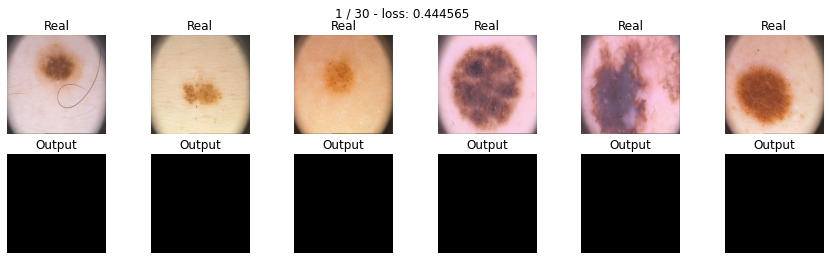

* Epoch 2/30
loss: 0.406382


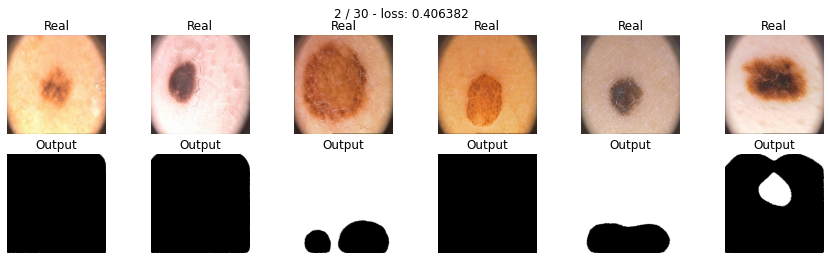

* Epoch 3/30
loss: 0.340104


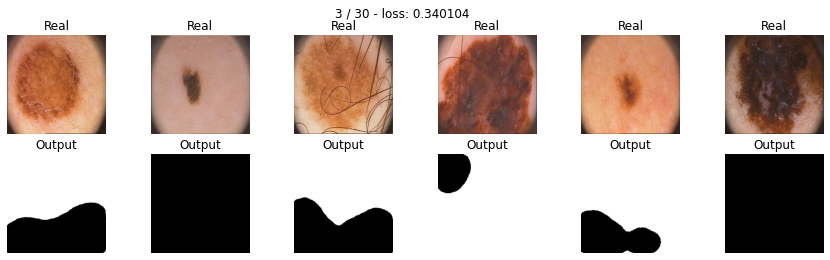

* Epoch 4/30
loss: 0.280272


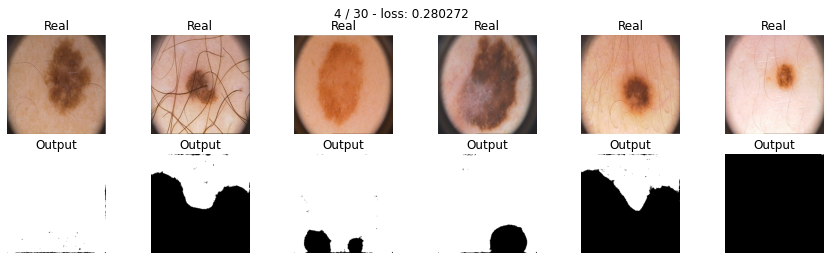

* Epoch 5/30
loss: 0.229480


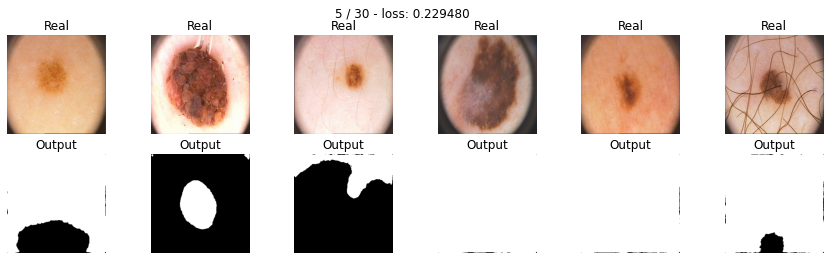

* Epoch 6/30
loss: 0.169434


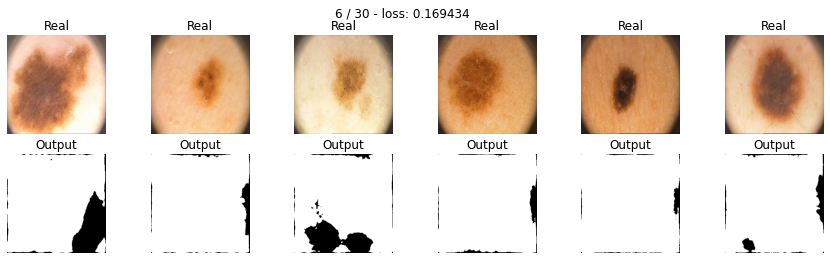

* Epoch 7/30
loss: 0.153166


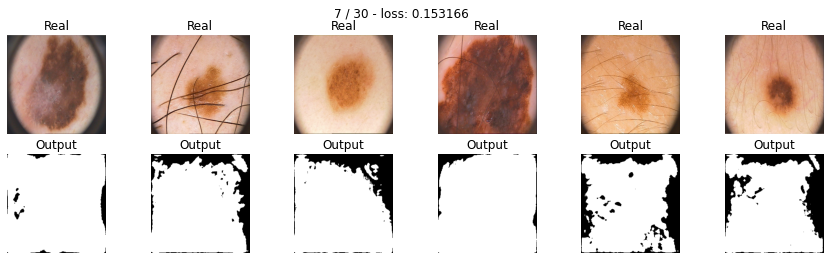

* Epoch 8/30
loss: 0.096576


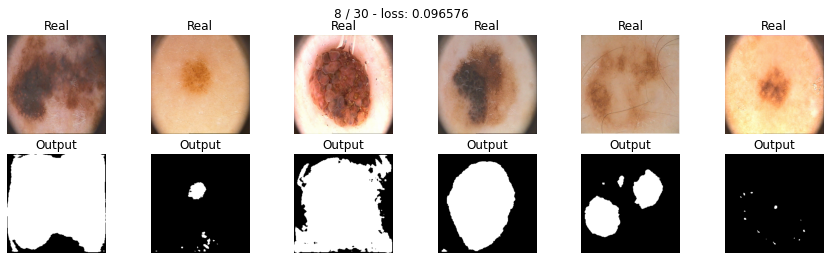

* Epoch 9/30
loss: 0.122429


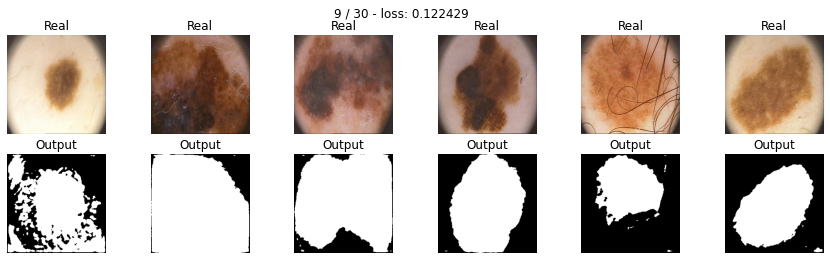

* Epoch 10/30
loss: 0.118478


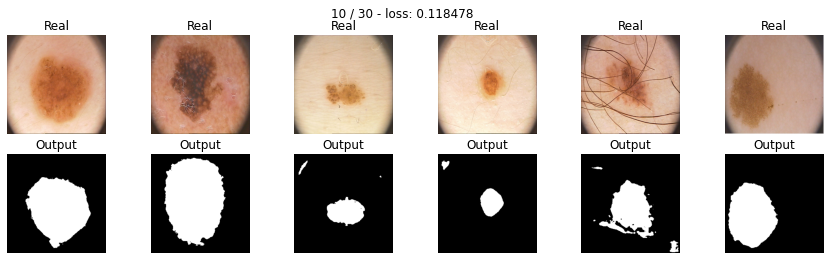

* Epoch 11/30
loss: 0.101435


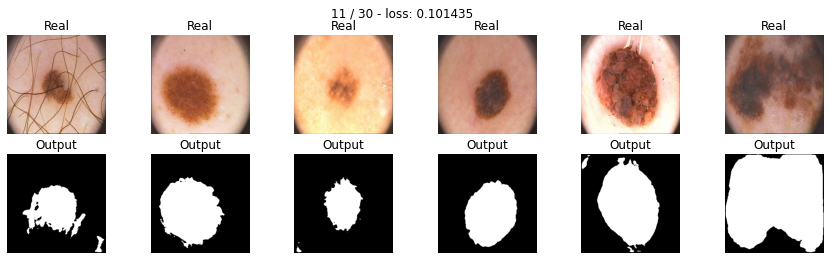

* Epoch 12/30
loss: 0.116530


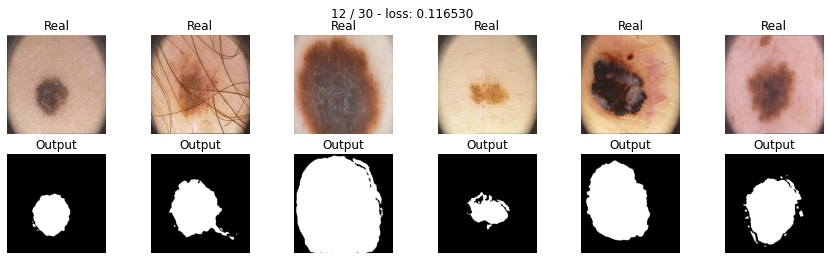

* Epoch 13/30
loss: 0.085601


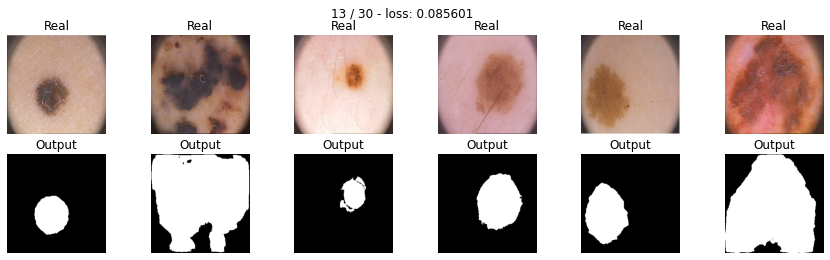

* Epoch 14/30
loss: 0.086798


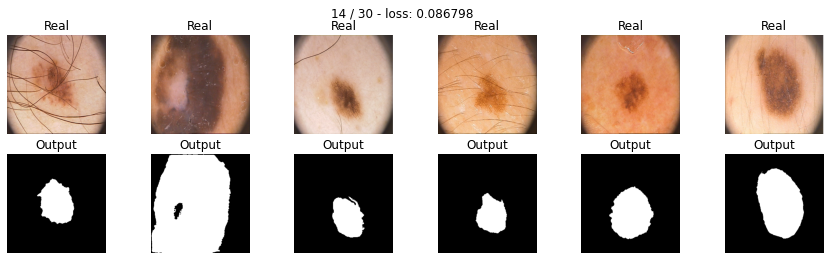

* Epoch 15/30
loss: 0.087332


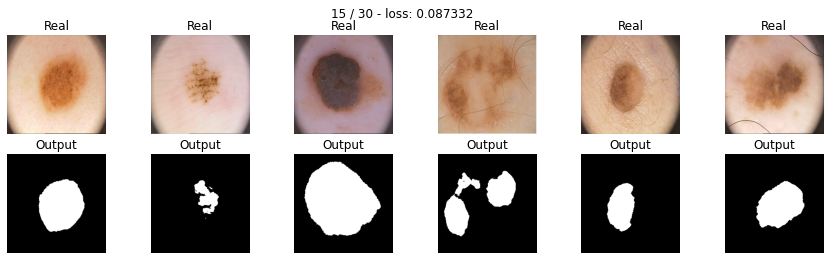

* Epoch 16/30
loss: 0.093447


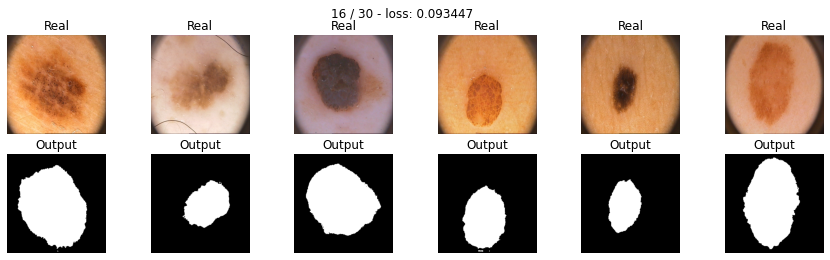

* Epoch 17/30
loss: 0.077419


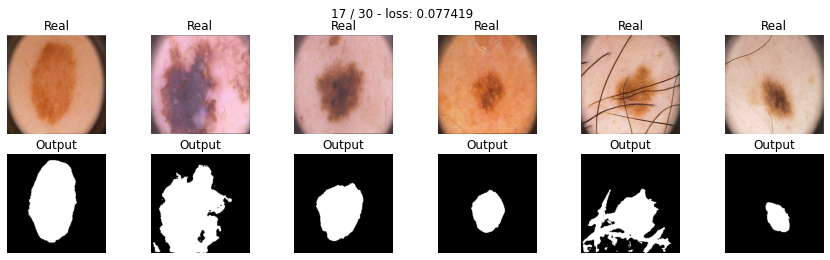

* Epoch 18/30
loss: 0.076105


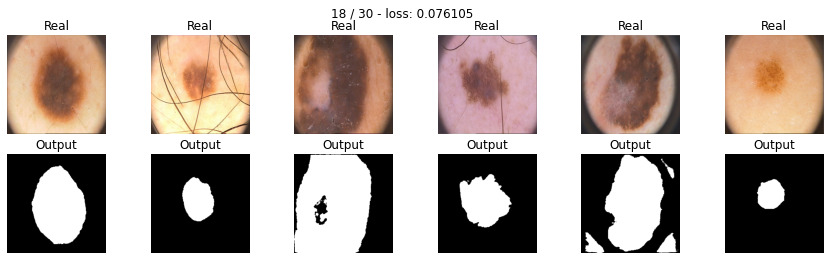

* Epoch 19/30
loss: 0.096202


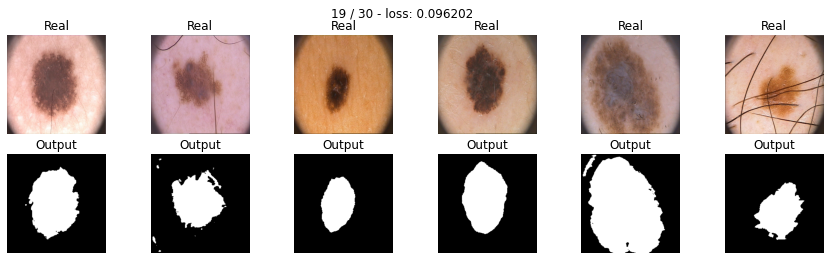

* Epoch 20/30
loss: 0.092564


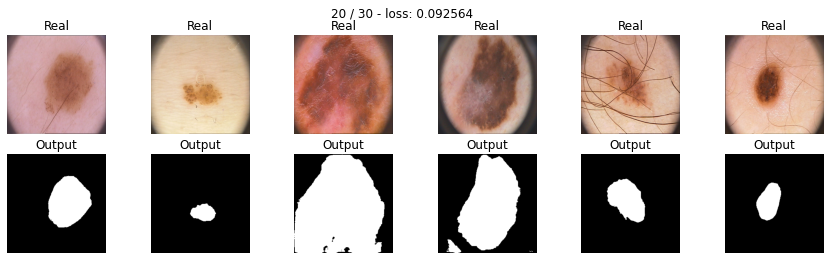

* Epoch 21/30
loss: 0.078606


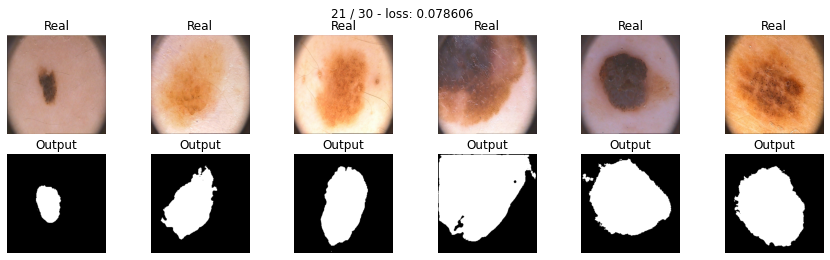

* Epoch 22/30
loss: 0.081020


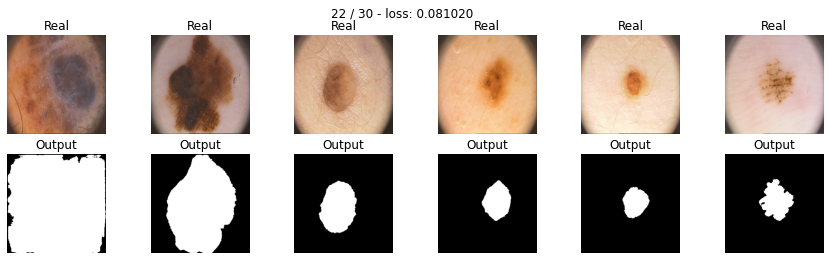

* Epoch 23/30
loss: 0.096847


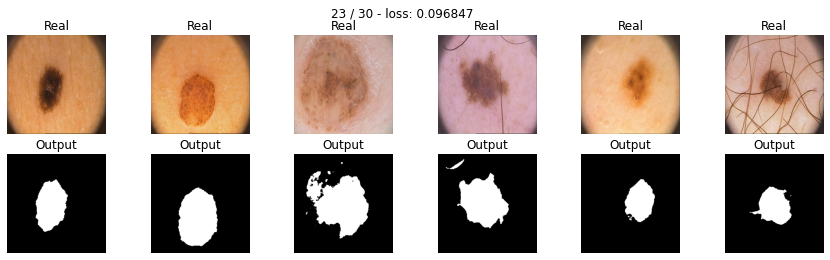

* Epoch 24/30
loss: 0.081505


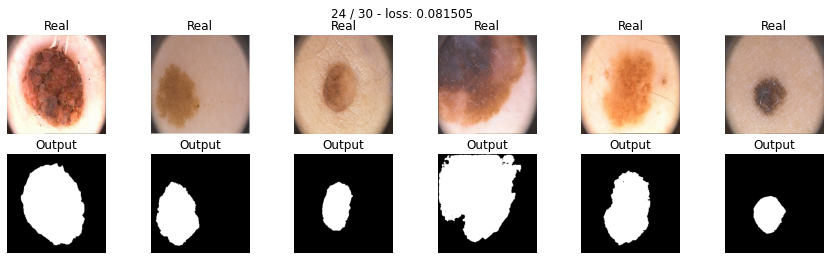

* Epoch 25/30
loss: 0.090925


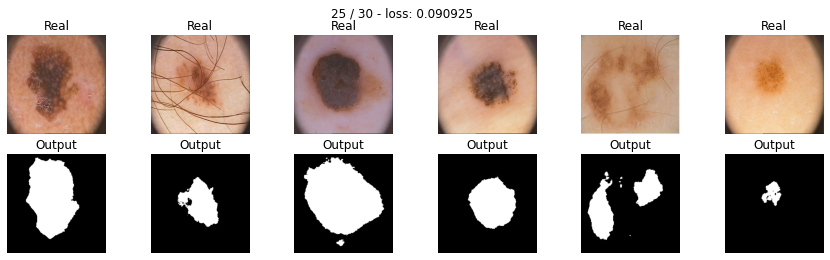

* Epoch 26/30
loss: 0.074762


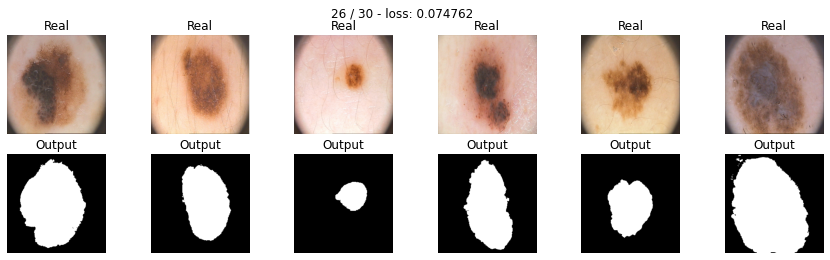

* Epoch 27/30
loss: 0.085004


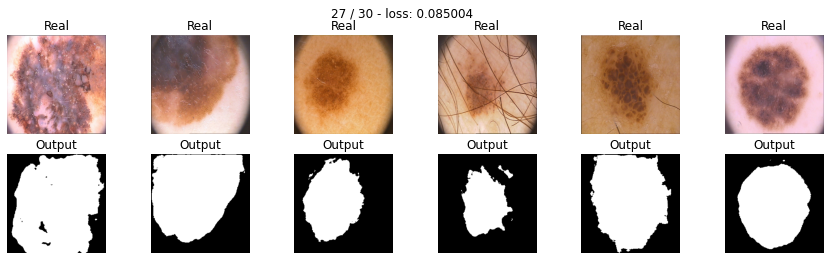

* Epoch 28/30
loss: 0.067334


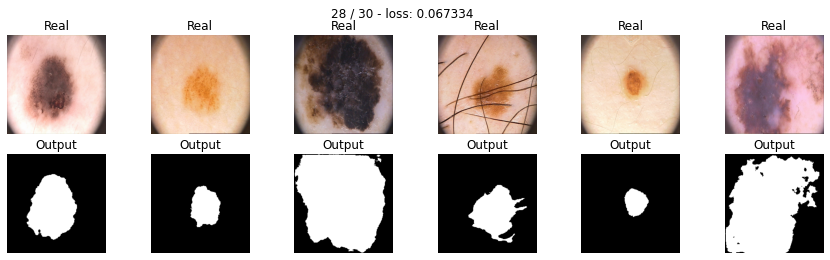

* Epoch 29/30
loss: 0.082443


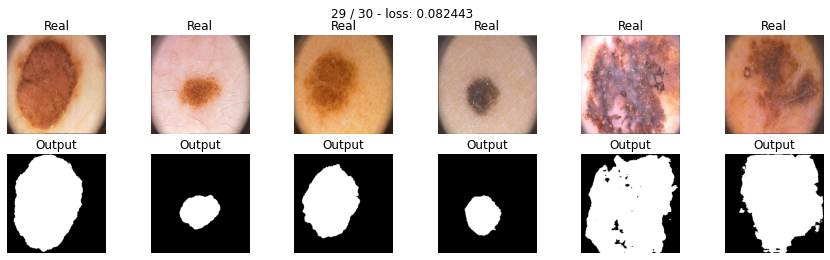

* Epoch 30/30
loss: 0.081576


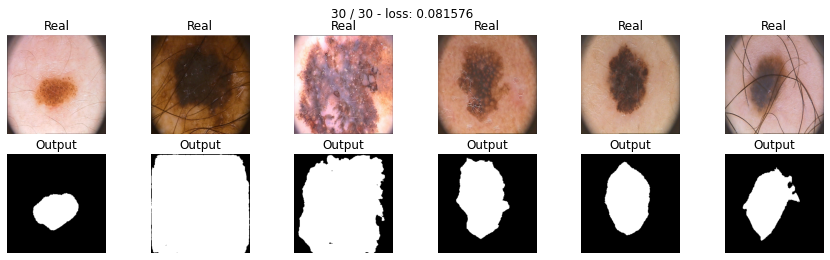

In [24]:
model_dice = SegNet().to(device)

max_epochs = 30
optimaizer = torch.optim.Adam(model_dice.parameters())
dice_loss = diceloss()
train(model_dice, optimaizer, dice_loss, max_epochs, data_tr, data_val)

Произведем оценку модели:

In [25]:
score_model(model_dice, iou_pytorch, data_val)

0.693333367506663

In [33]:
torch.save(model_dice.state_dict(), 'PH2Dataset/lstmmodelgpu_dice.pth')

In [ ]:
model_dice.load_state_dict(torch.load('PH2Dataset/lstmmodelgpu_dice.pth.pth'))

Согласно полученным результатам одна и та же модель обучается очень поразному в зависимости от выбранной функции потерь. Dice loss оказался гораздо более подходящим для нашей задачи(в общем-то как и писали об этом в статьях). 

Теперь реализуем архитектуру Unet, отличительной особенностью которой являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

In [16]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()


        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2)  # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.pool2 =  nn.MaxPool2d(kernel_size=2, stride=2) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.drop1 = nn.Dropout2d(0.5)
        self.pool3 =  nn.MaxPool2d(kernel_size=2, stride=2)# 32 -> 16
        self.enc_conv4 = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.Conv2d(1024, 1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU()
        )
        self.drop2 = nn.Dropout2d(0.5)

        # decoder (upsampling)
        self.upsample0 = nn.Sequential( # 16 -> 32
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(1024, 512, kernel_size=1, padding=0),
            nn.ReLU(inplace=True)
        )
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(1024, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.upsample1 = nn.Sequential( # 32 -> 64
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(512, 256, kernel_size=1, padding=0),
            nn.ReLU(inplace=True)
        ) 
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.upsample2 =  nn.Sequential( # 64 -> 128
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(256, 128, kernel_size=1, padding=0),
            nn.ReLU(inplace=True)
        ) 
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.upsample3 = nn.Sequential( # 128 -> 256
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(128, 64, kernel_size=1, padding=0),
            nn.ReLU(inplace=True)
        )  
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.dec_conv4 = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e1 = self.enc_conv1(self.pool0(e0))
        e2 = self.enc_conv2(self.pool1(e1))
        e3 = self.enc_conv3(self.pool2(e2))
        e3 = self.drop1(e3)
        e4 = self.enc_conv4(self.pool3(e3))
        e4 = self.drop2(e4)

        # decoder
        d0 = self.upsample0(e4)
        diffY = e3.size()[2] - d0.size()[2]
        diffX = e3.size()[3] - d0.size()[3]
        d0 = nn.functional.pad(d0, (diffX // 2, diffX - diffX//2,
                                    diffY // 2, diffY - diffY//2))
        d1 = torch.cat([e3,d0], dim=1)
        d1 = self.dec_conv0(d1)

        d2 = self.upsample1(d1)
        diffY = e2.size()[2] - d2.size()[2]
        diffX = e2.size()[3] - d2.size()[3]
        d2 = nn.functional.pad(d2, (diffX // 2, diffX - diffX//2,
                                    diffY // 2, diffY - diffY//2))
        d3 = torch.cat([e2,d2], dim=1)
        d3 = self.dec_conv1(d3)

        d4 = self.upsample2(d3)
        diffY = e1.size()[2] - d4.size()[2]
        diffX = e1.size()[3] - d4.size()[3]
        d4 = nn.functional.pad(d4, (diffX // 2, diffX - diffX//2,
                                    diffY // 2, diffY - diffY//2))
        d5 = torch.cat([e1,d4], dim=1)
        d5 = self.dec_conv2(d5)

        d6 = self.upsample3(d5)
        diffY = e0.size()[2] - d6.size()[2]
        diffX = e0.size()[3] - d6.size()[3]
        d6 = nn.functional.pad(d6, (diffX // 2, diffX - diffX//2,
                                    diffY // 2, diffY - diffY//2))
        d7 = torch.cat([e0,d6], dim=1)
        d7 = self.dec_conv3(d7)

        d8 = self.dec_conv4(d7)


        return d8

In [17]:
unet_model = UNet().to(device)

* Epoch 1/30
loss: 0.475910


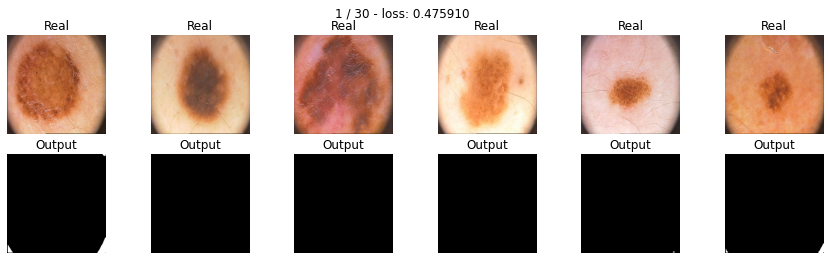

* Epoch 2/30
loss: 0.340355


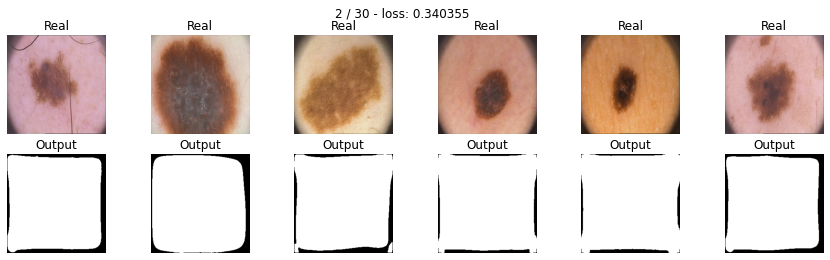

* Epoch 3/30
loss: 0.313379


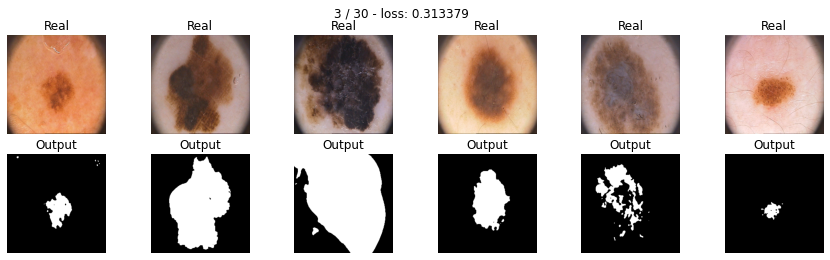

* Epoch 4/30
loss: 0.289273


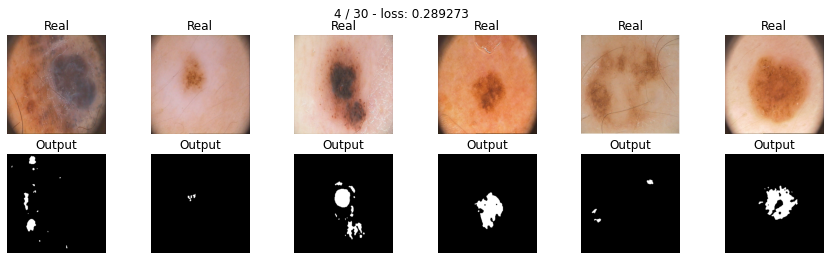

* Epoch 5/30
loss: 0.281703


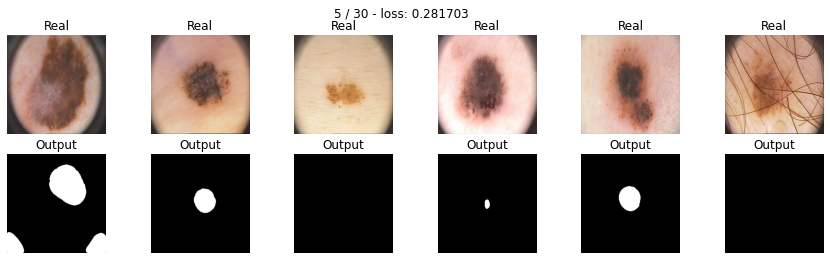

* Epoch 6/30
loss: 0.266253


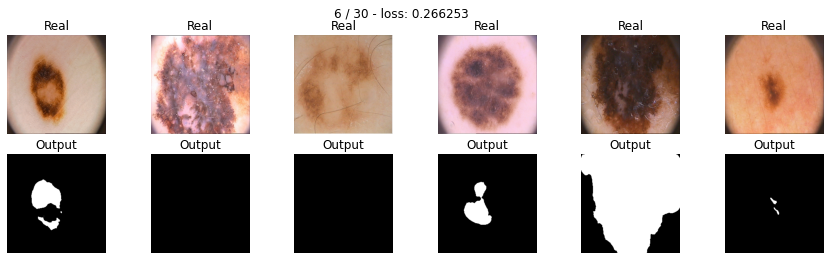

* Epoch 7/30
loss: 0.238813


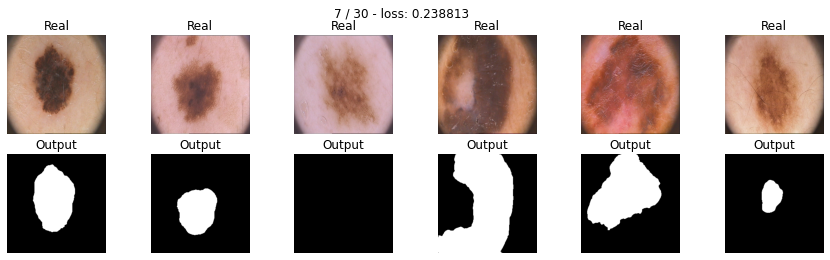

* Epoch 8/30
loss: 0.242783


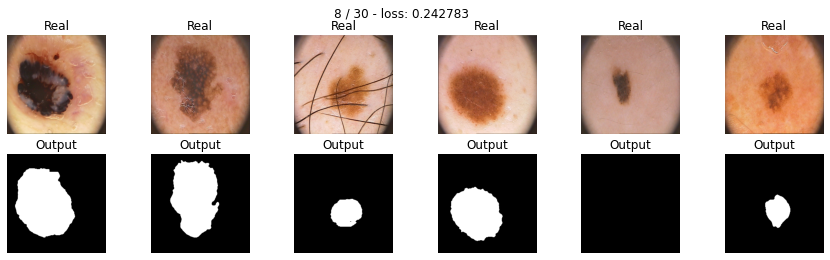

* Epoch 9/30
loss: 0.226986


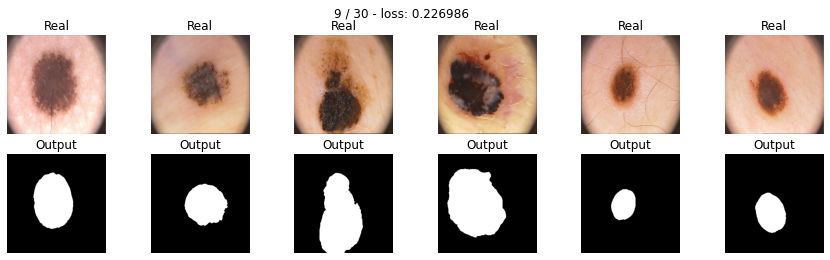

* Epoch 10/30
loss: 0.206146


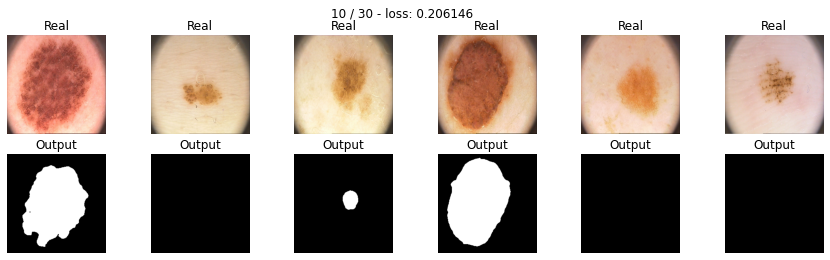

* Epoch 11/30
loss: 0.256169


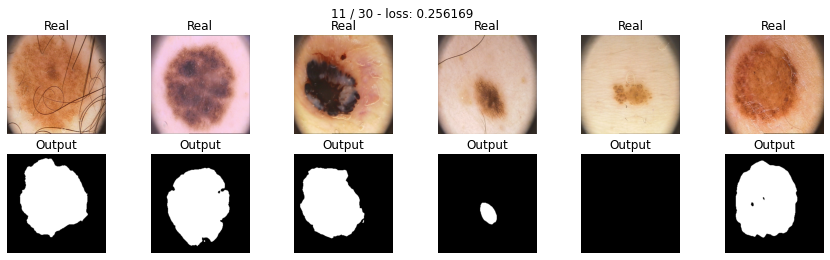

* Epoch 12/30
loss: 0.222165


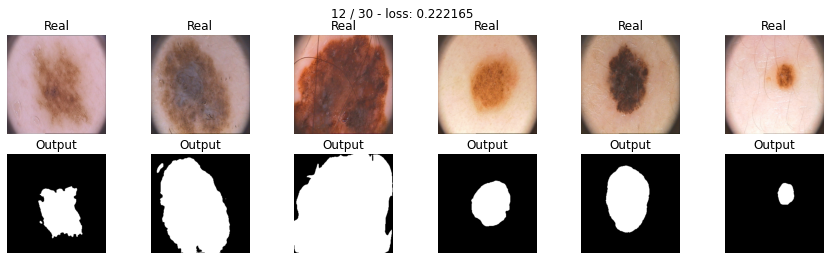

* Epoch 13/30
loss: 0.212203


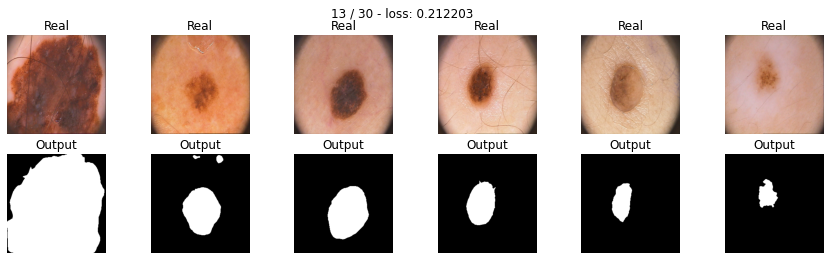

* Epoch 14/30
loss: 0.213036


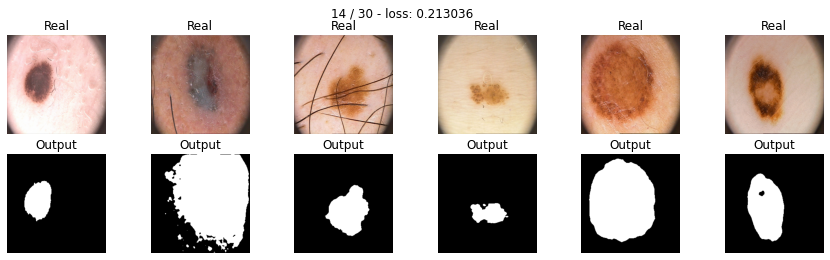

* Epoch 15/30
loss: 0.203169


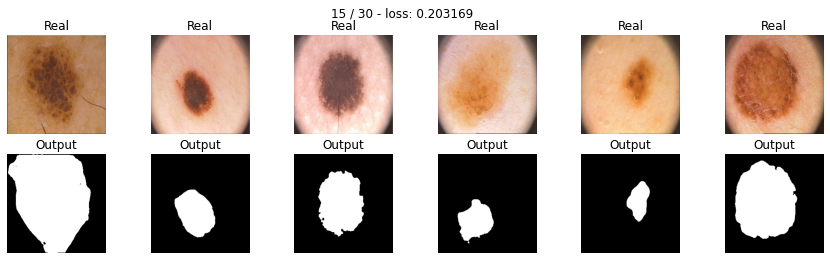

* Epoch 16/30
loss: 0.208799


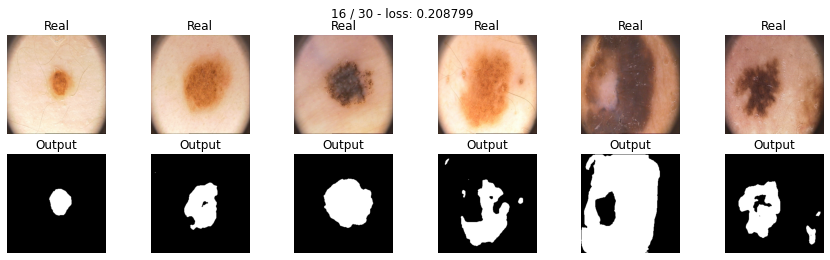

* Epoch 17/30
loss: 0.194565


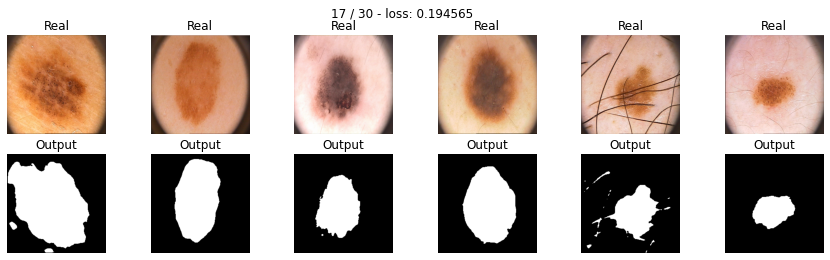

* Epoch 18/30
loss: 0.172263


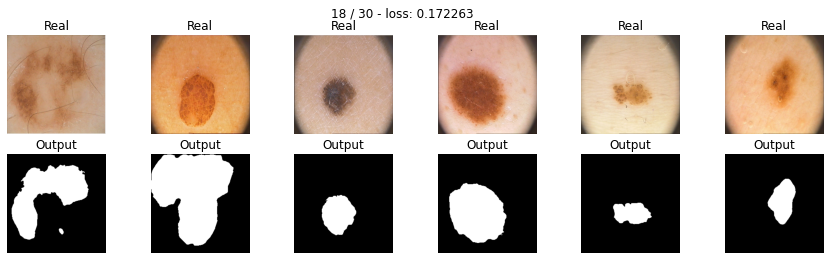

* Epoch 19/30
loss: 0.195331


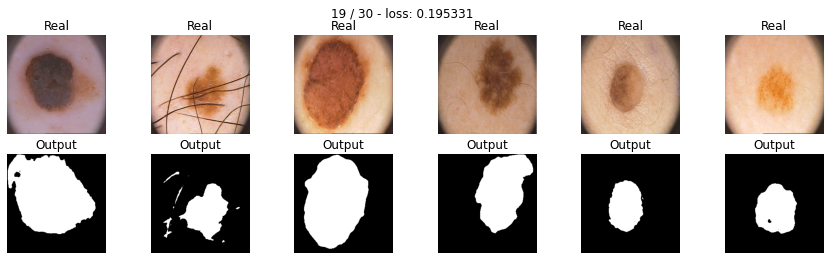

* Epoch 20/30
loss: 0.194879


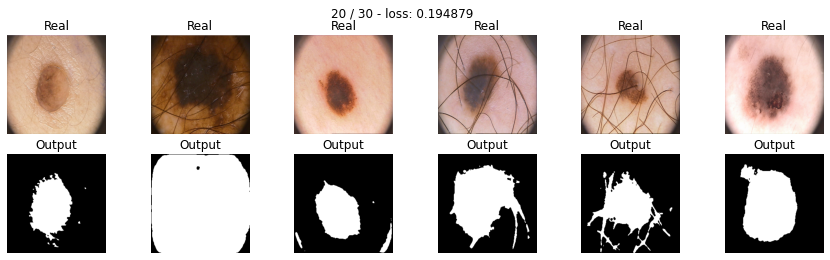

* Epoch 21/30
loss: 0.194676


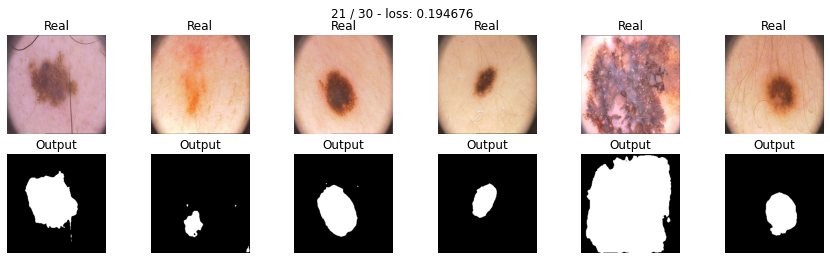

* Epoch 22/30
loss: 0.176497


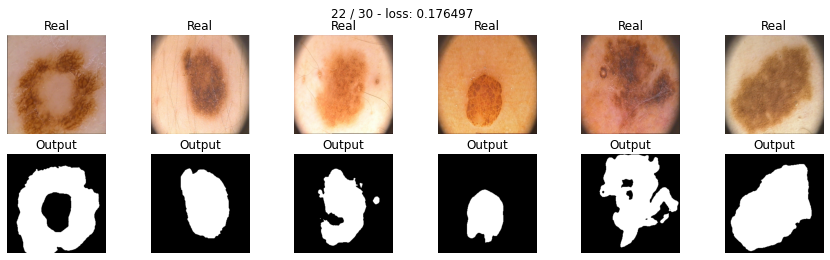

* Epoch 23/30
loss: 0.165175


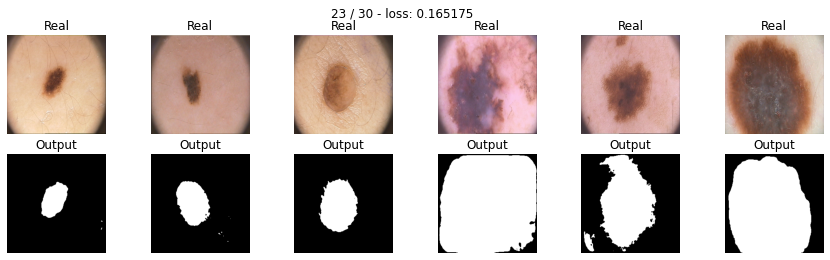

* Epoch 24/30
loss: 0.155483


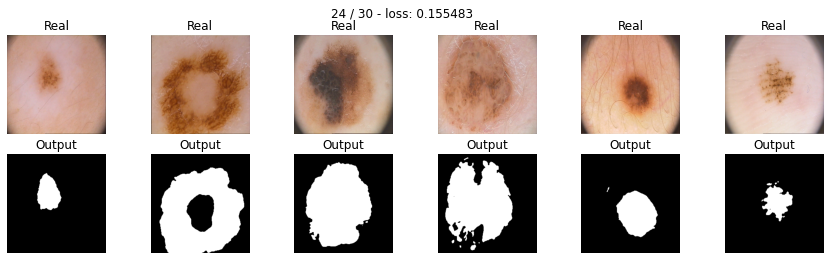

* Epoch 25/30
loss: 0.164850


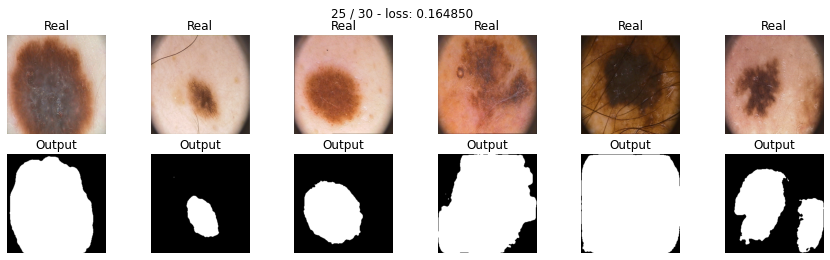

* Epoch 26/30
loss: 0.200535


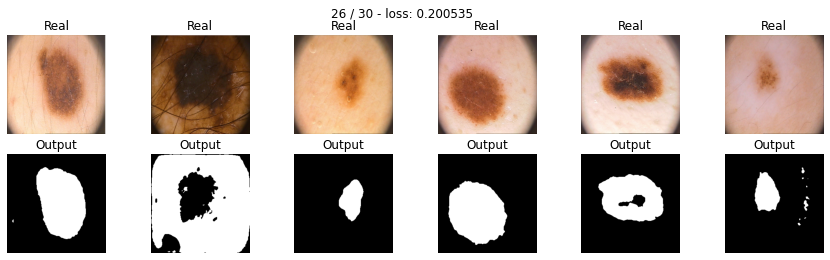

* Epoch 27/30
loss: 0.161599


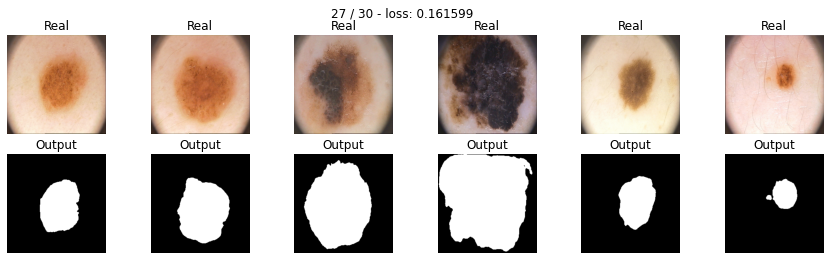

* Epoch 28/30
loss: 0.151626


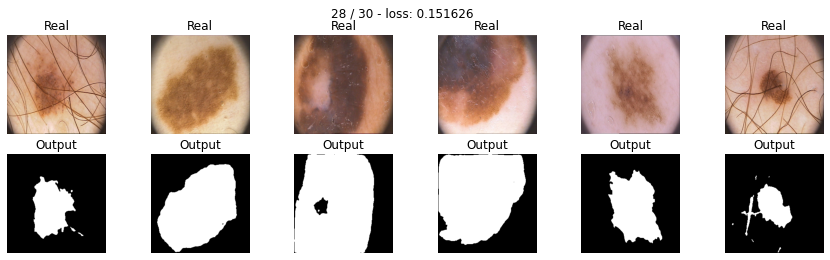

* Epoch 29/30
loss: 0.160993


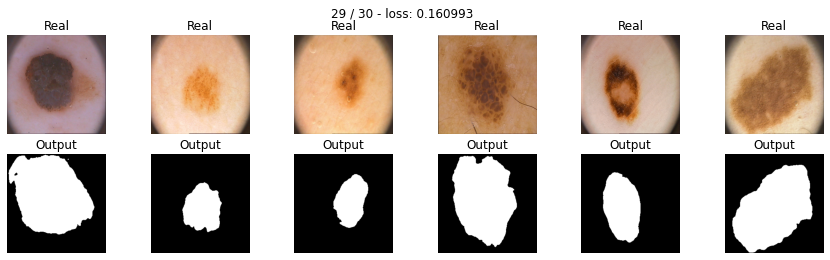

* Epoch 30/30
loss: 0.137208


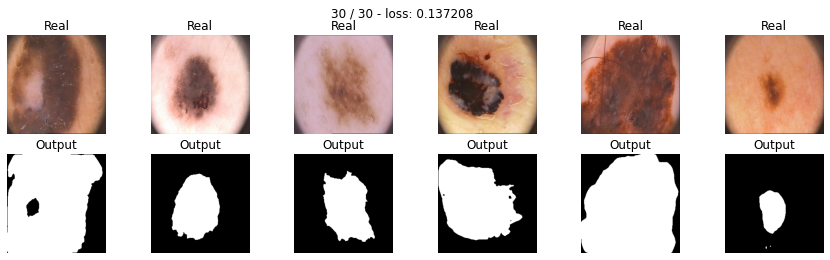

In [29]:
train(unet_model, torch.optim.Adam(unet_model.parameters()), bce_loss, 30, data_tr, data_val)

In [26]:
score_model(unet_model, iou_pytorch, data_val)

RuntimeError: ignored

In [34]:
torch.save(unet_model.state_dict(), 'PH2Dataset/lstmmodelgpu_2.pth')

In [18]:
unet_model.load_state_dict(torch.load('PH2Dataset/lstmmodelgpu_2.pth'))

<All keys matched successfully>

* Epoch 1/30
loss: 0.263506


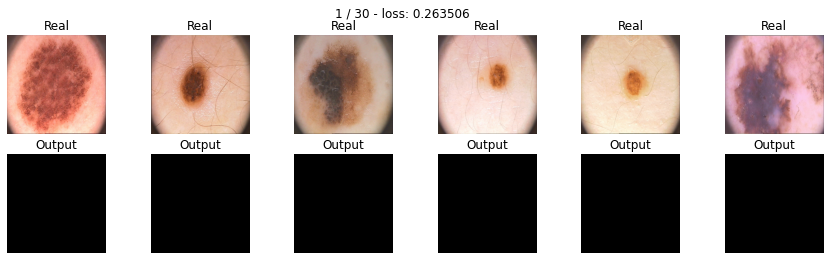

* Epoch 2/30
loss: 0.181978


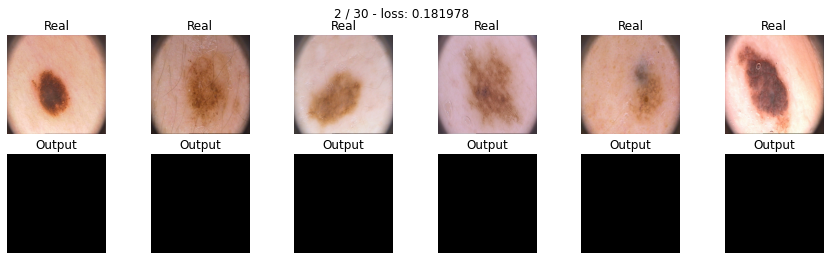

* Epoch 3/30
loss: 0.169910


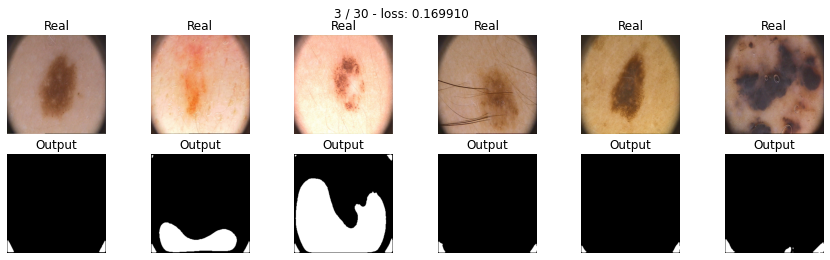

* Epoch 4/30
loss: 0.151001


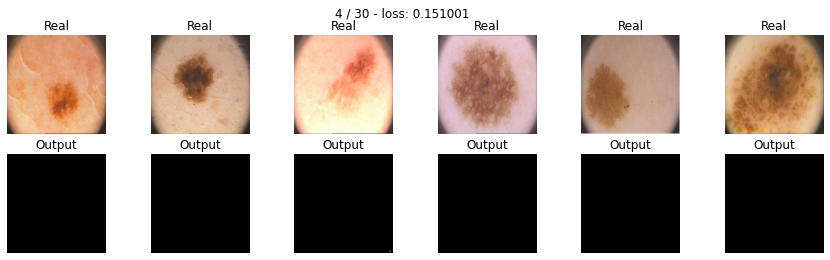

* Epoch 5/30
loss: 0.136941


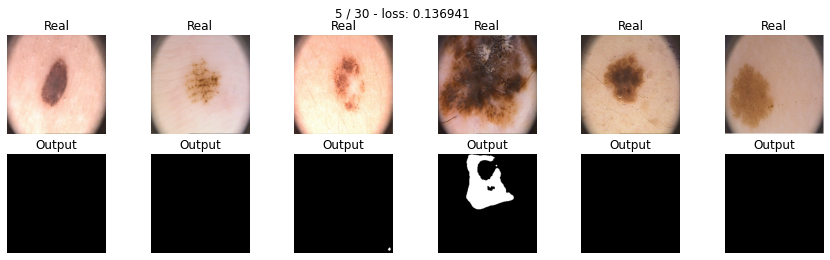

* Epoch 6/30
loss: 0.130897


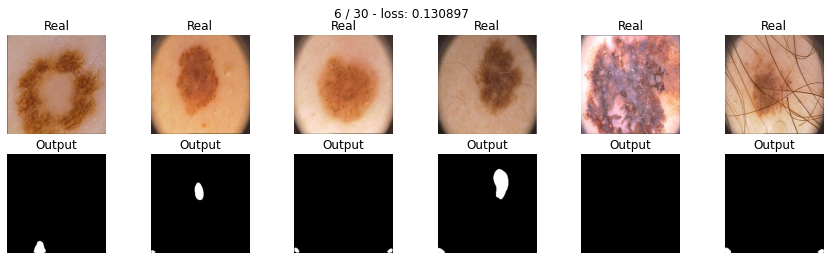

* Epoch 7/30
loss: 0.117182


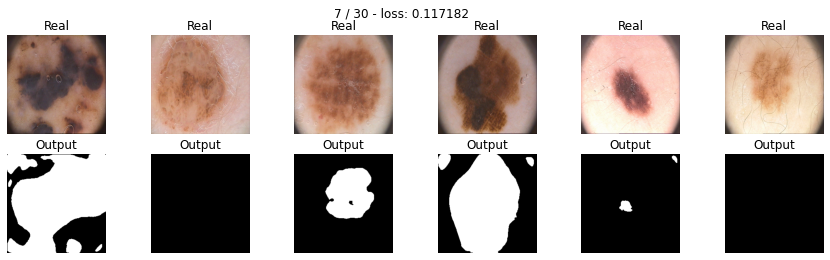

* Epoch 8/30
loss: 0.107719


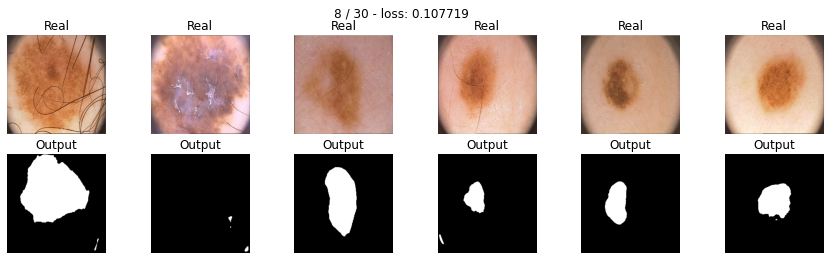

* Epoch 9/30
loss: 0.098595


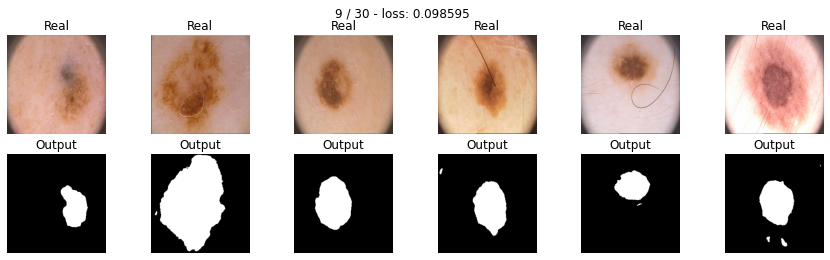

* Epoch 10/30
loss: 0.108376


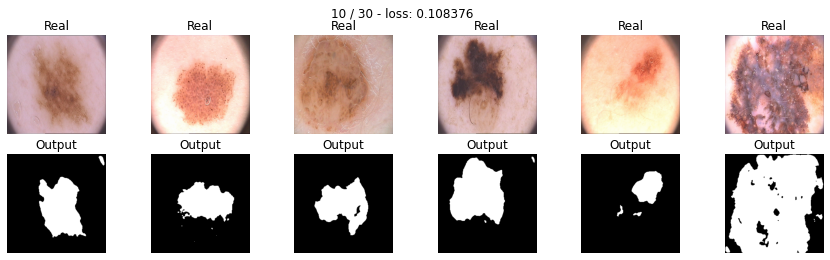

* Epoch 11/30
loss: 0.101769


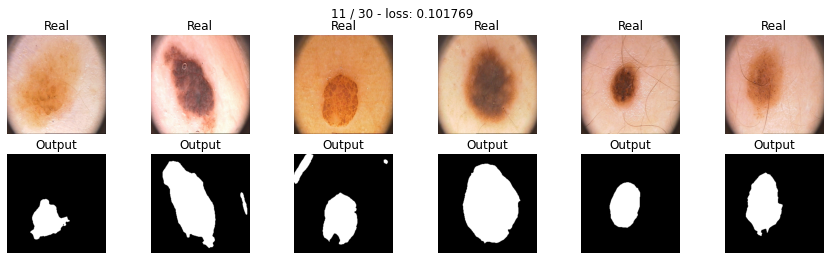

* Epoch 12/30
loss: 0.093671


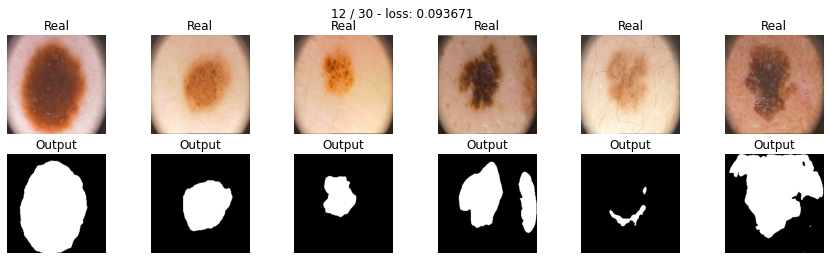

* Epoch 13/30
loss: 0.091351


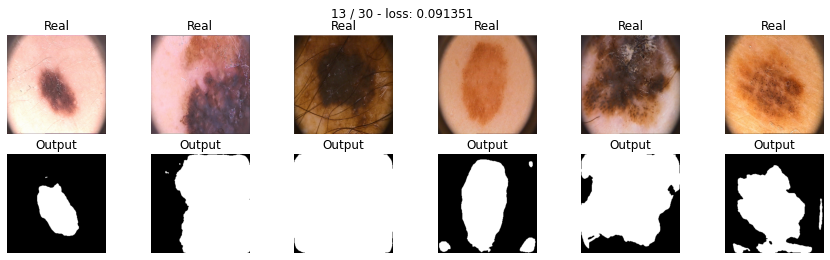

* Epoch 14/30
loss: 0.087198


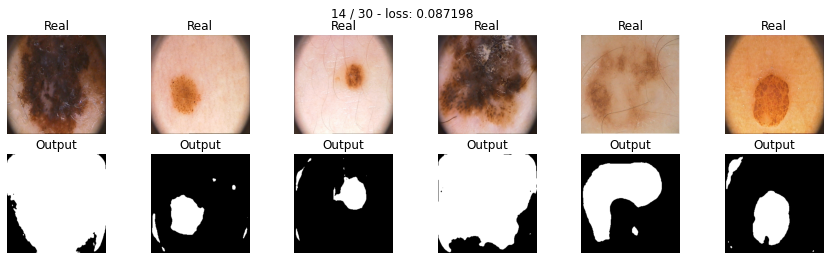

* Epoch 15/30
loss: 0.079696


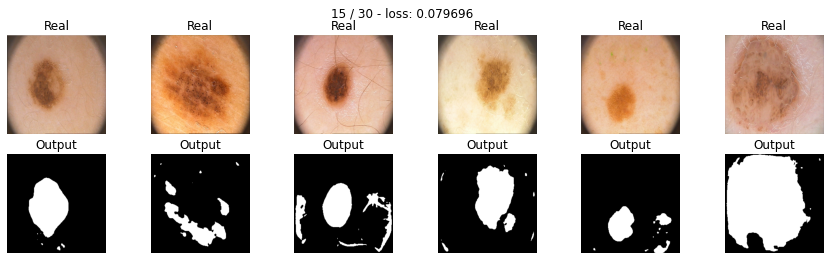

* Epoch 16/30
loss: 0.098393


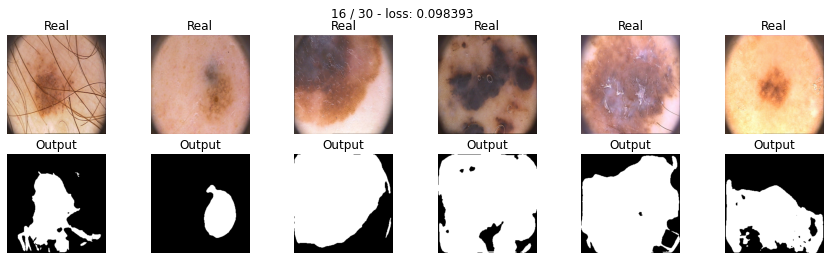

* Epoch 17/30
loss: 0.089968


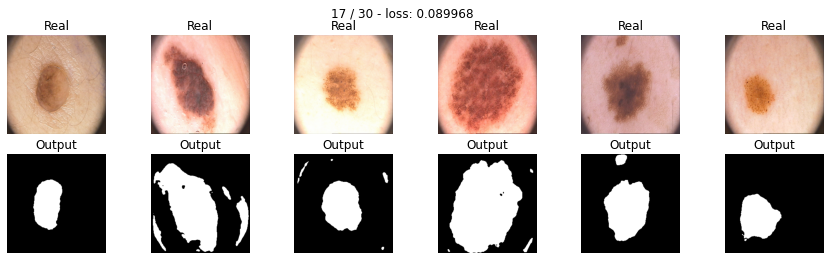

* Epoch 18/30
loss: 0.083219


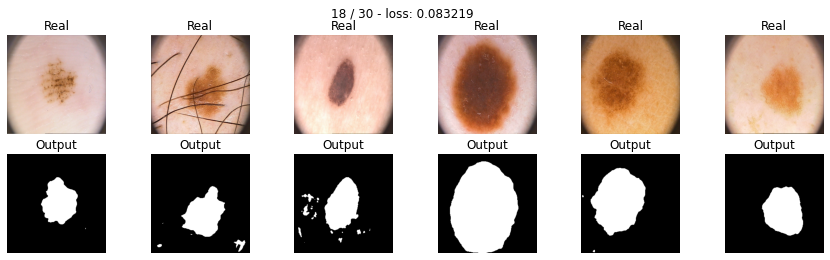

* Epoch 19/30
loss: 0.078109


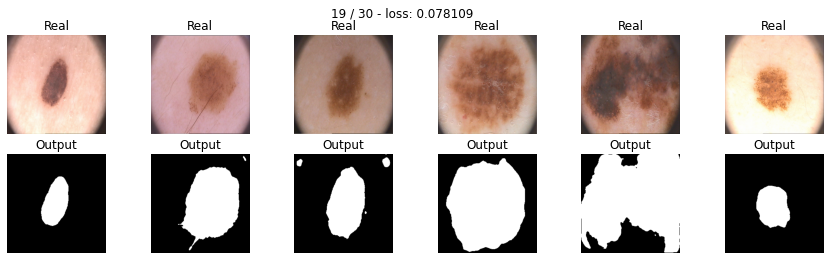

* Epoch 20/30
loss: 0.082937


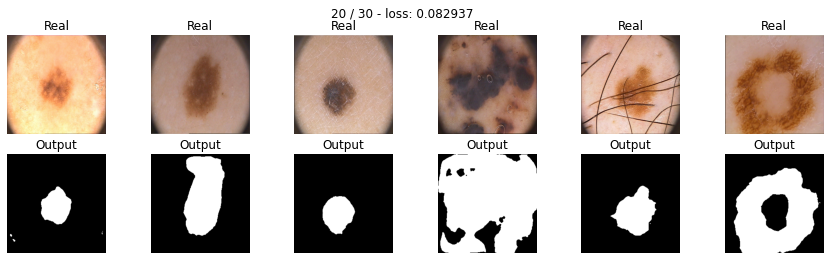

* Epoch 21/30
loss: 0.066808


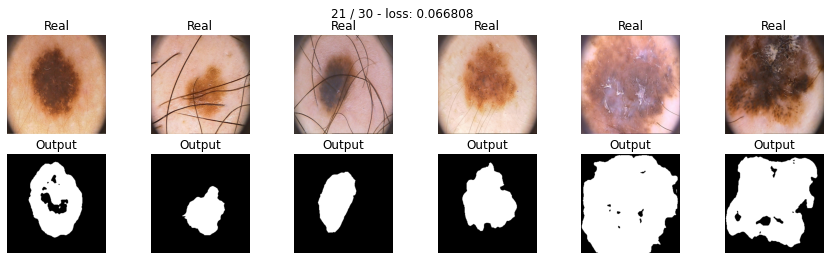

* Epoch 22/30
loss: 0.074952


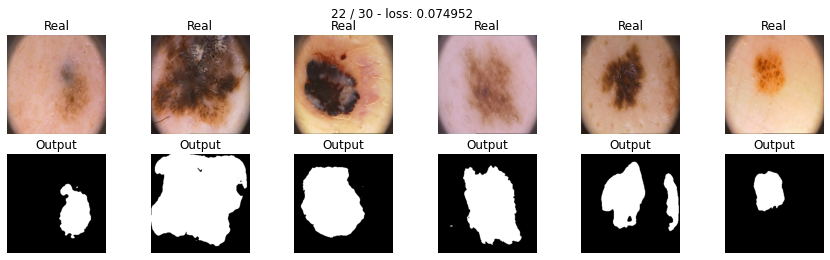

* Epoch 23/30
loss: 0.083289


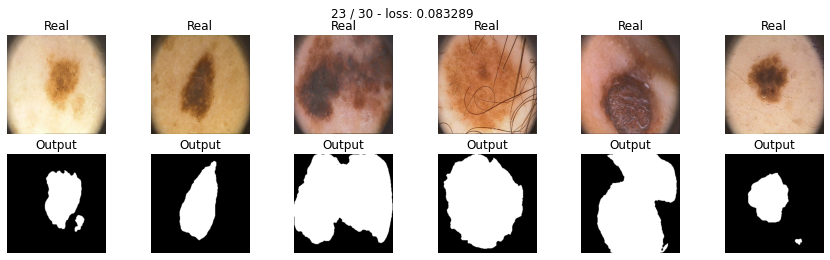

* Epoch 24/30
loss: 0.071121


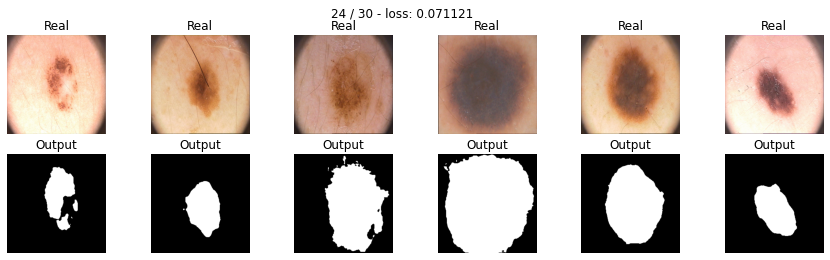

* Epoch 25/30
loss: 0.065198


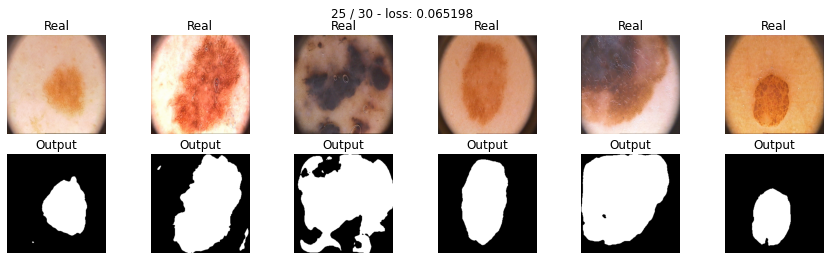

* Epoch 26/30
loss: 0.065063


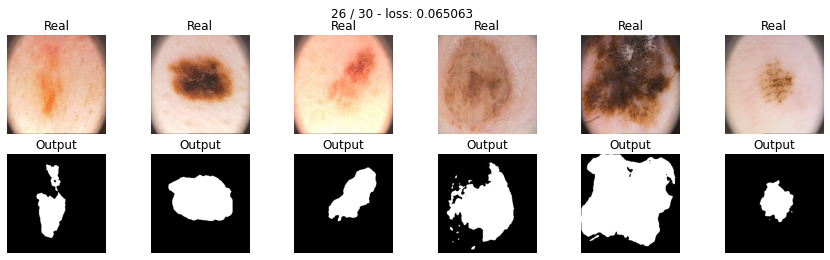

* Epoch 27/30
loss: 0.068587


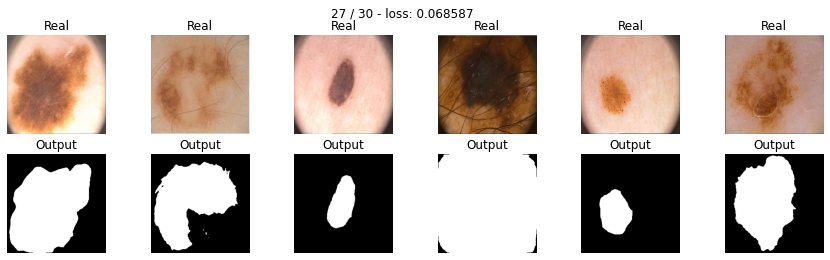

* Epoch 28/30
loss: 0.061952


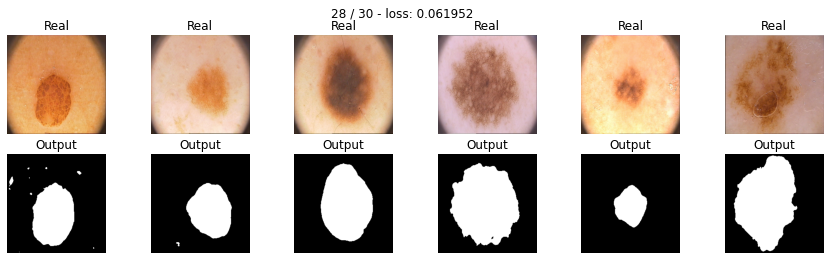

* Epoch 29/30
loss: 0.062367


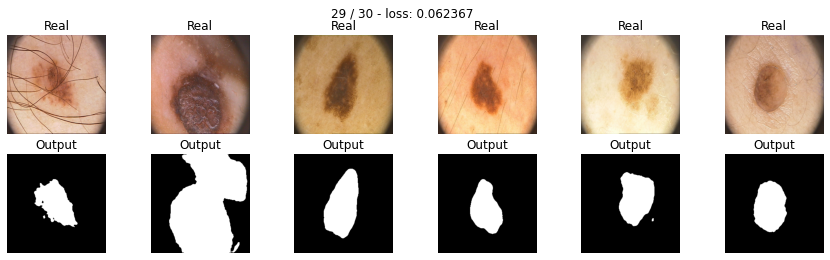

* Epoch 30/30
loss: 0.073014


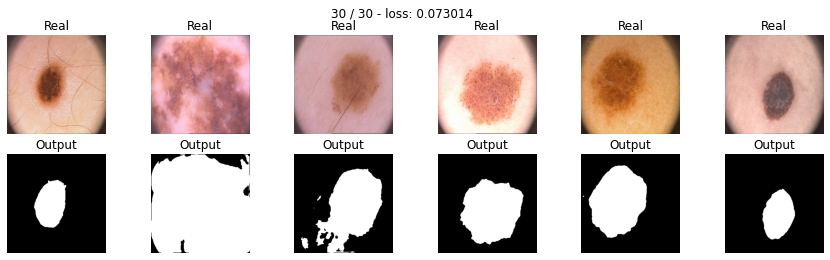

In [34]:
model_dice_2 = UNet().to(device)

max_epochs = 30
optimaizer = torch.optim.Adam(model_dice_2.parameters())
dice_loss = diceloss()
train(model_dice_2, optimaizer, dice_loss, max_epochs, data_tr, data_val)

Наилучшие результаты показал Unet обученный с dice loss